In [1]:
"""
Data visualization
Author: Xionghui Xu
Date: July 11, 2025
"""
import os
import numpy as np
import xarray as xr
import pandas as pd
import netCDF4 as nc
import geopandas as gpd
import rioxarray as rxr
from concurrent.futures import ThreadPoolExecutor
import warnings
from pathlib import Path

In [2]:
#### Here we set the configuration
resolution = "500"
region = [-180,180,-60,90]
data_path = f'data/run/'
shp_path = 'data/Shp/'
field_path = 'data/field/'
fig_path = 'fig/'

# Visualization

## 1. Data Export

In [ ]:
def load_and_flatten_data(file_name, variable_name, index=None, path='data/run/'):
    try:
        with nc.Dataset(f"{path}{file_name}.nc4") as dataset:
            data = dataset[variable_name][index, :, :].flatten() if index is not None else dataset[variable_name][:, :].flatten()
        return data
    except Exception as e:
        warnings.warn(f"Error loading {file_name}.nc4 or variable {variable_name}: {e}")
        return None

def load_lat_lon(data_path):
    try:
        with nc.Dataset(f"{data_path}masking_criteria/mask_combine_all.nc4") as dataset:
            lat = dataset['lat'][:]
            lon = dataset['lon'][:]
            # Use meshgrid for efficient grid creation
            lon_grid, lat_grid = np.meshgrid(lon, lat)
            return lat_grid.ravel(), lon_grid.ravel()
    except Exception as e:
        warnings.warn(f"Error loading lat/lon from masking_criteria/mask_combine_all.nc4: {e}")
        return None, None

def load_all_data(file_variable_list, data_path='data/run/'):
    # Initialize DataFrame
    df = pd.DataFrame()

    # Load lat/lon first
    lat, lon = load_lat_lon(data_path)
    if lat is None or lon is None:
        raise RuntimeError("Failed to load latitude/longitude data")
    df['lat'] = lat
    df['lon'] = lon

    # Load other variables
    for file_name, variable_name, index in file_variable_list:
        data = load_and_flatten_data(file_name, variable_name, index, data_path)
        if data is not None:
            df[file_name] = data

    return df

# Configuration
data_path = 'data/run/'
file_variable_list = [
    ('masking_criteria/mask_combine_all', 'Band1', None),
    ('Dbedrock_Frequency', 'Dbedrock', None),
    ('Sbedrock', 'Band1', None),
    ('Area', 'area', None),
    ('PR_mean', 'tp', 0),
    ('ET_mean', 'et', 0),
]

# Load all data
try:
    df = load_all_data(file_variable_list, data_path)
    df = df[df['masking_criteria/mask_combine_all'] == 1]
    df = df.drop(columns=['masking_criteria/mask_combine_all'])
except Exception as e:
    print(f"Error processing data: {e}")

df

,lat,lon,Dbedrock_Frequency,Sbedrock,Area,PR_mean,ET_mean
708161369,-55.847915,-67.627077,1.0,0.236460,120515.621801,692.439941,2.555584
708161370,-55.847915,-67.622911,1.0,0.279453,120515.621801,691.950134,3.020087
708161371,-55.847915,-67.618744,1.0,0.322446,120515.621801,691.460266,3.484589
708161372,-55.847915,-67.614577,1.0,0.365440,120515.621801,690.970398,3.949090
708161373,-55.847915,-67.610411,1.0,0.408433,120515.621801,690.480591,4.413592
...,...,...,...,...,...,...,...
3586500782,82.960426,-26.739575,1.0,39.301605,26309.225697,125.175171,107.267189
3586500783,82.960426,-26.735409,1.0,39.884819,26309.225697,125.231812,107.503296
3586500784,82.960426,-26.731242,1.0,40.468037,26309.225697,125.288445,107.739403
3586500785,82.960426,-26.727075,1.0,41.051250,26309.225697,125.345085,107.975510


## 2. Plotting

In [11]:
%matplotlib inline

import cmaps
import geopandas as gpd
from pylab import rcParams
import seaborn as sns
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import matplotlib.ticker as ticker
import matplotlib.patches as patches
import matplotlib.font_manager as fm
from matplotlib.gridspec import GridSpec
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter

In [12]:
os.makedirs(f'{fig_path}', exist_ok=True)

pd.set_option('display.max_columns', None)

params = {'font.family': 'Arial',
          'backend': 'ps',
          'axes.labelsize': 25,
          'grid.linewidth': 0.2,
          'font.size': 25,
          'legend.fontsize': 18,
          'legend.frameon': False,
          'xtick.labelsize': 30,
          'xtick.direction': 'out',
          'ytick.labelsize': 30,
          'ytick.direction': 'out',
          'legend.handlelength': 1,
          'legend.handleheight': 1,
          'savefig.bbox': 'tight',
          'axes.unicode_minus': False,
          "mathtext.default":"regular",
          'text.usetex': False}
rcParams.update(params)

font_properties = fm.FontProperties(family='Arial', weight='bold')
size = 0.0005

### 2.1 Extended Data Fig. 2

In [13]:
def draw(df1,name,level,cmap):
    df1 = df1[df1[name[1]] > 0]

    fig = plt.figure(figsize=(12, 6), dpi=500)

    fig.subplots_adjust(left=0, right=1, 
                    bottom=0, top=1) 
        
    #Create a subgraph grid with 2 rows and 3 columns
    gs = GridSpec(2, 6)
    ax = fig.add_subplot(gs[:, :], projection=ccrs.PlateCarree())

        # Set drawing mode(note:extent's lat from positive to negative)
    img = ax.scatter(df1['lon'], df1['lat'], c=df1[name[0]]/df1[name[1]]*100, 
                    s=size, linewidths=0, edgecolors="k", 
                    cmap=cmap, zorder=1, vmin=level[0], vmax=level[-1])

    for spine in ax.spines.values():
        spine.set_edgecolor('black')  
        spine.set_linewidth(0)  

    ax.set_xlim(region[0], region[1])
    ax.set_ylim(region[2], region[3])

    # coastline = cfeature.NaturalEarthFeature('physical', 'coastline', '50m', edgecolor='0.6', facecolor='none')
    rivers = cfeature.NaturalEarthFeature('physical', 'rivers_lake_centerlines', '110m', edgecolor='0.6', facecolor='none')
    ax.add_feature(cfeature.LAND, facecolor='0.95')
    # ax.add_feature(coastline, linewidth=0.6)
    ax.add_feature(cfeature.LAKES, alpha=1, facecolor='white', edgecolor='white')
    ax.add_feature(rivers, linewidth=0.8)
    # ax.gridlines(draw_labels=False, linestyle=':', linewidth=0.7, color='grey', alpha=0.8)

    ax.add_feature(cfeature.COASTLINE)
    ax.set_extent(region)
    ax.xaxis.set_major_formatter(LongitudeFormatter())
    ax.yaxis.set_major_formatter(LatitudeFormatter())

    ax.text(-20,-58,f'{name[3]}', fontsize=25, fontweight='bold')
    plt.tight_layout()
    plt.show()

In [14]:
df1 = df.copy()

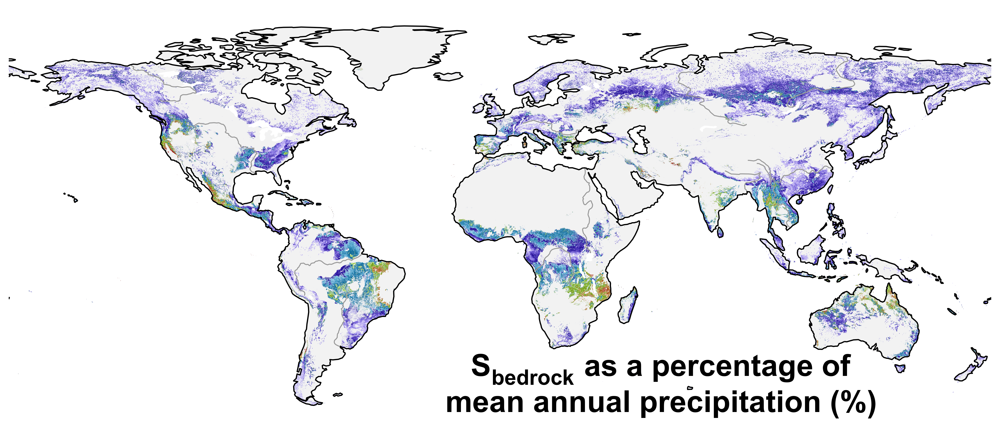

In [15]:
name = ['Sbedrock', 'PR_mean', 'Sbedrock_div_PR_mean', '   $S_{{bedrock}}$ as a percentage of \nmean annual precipitation (%)']
level = np.arange(0,60,10)
cmap = cmaps.StepSeq25_r
draw(df1,name,level,cmap)

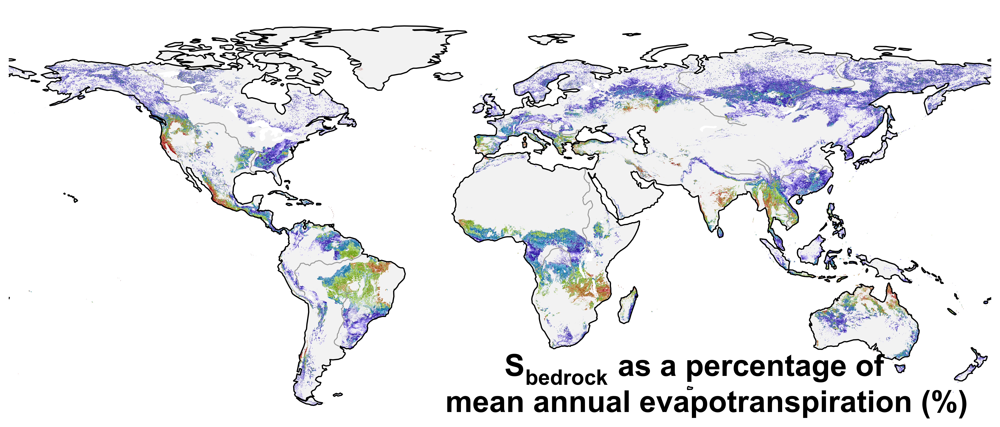

In [16]:
name = ['Sbedrock', 'ET_mean', 'Sbedrock_div_ET_mean', '       $S_{{bedrock}}$ as a percentage of \nmean annual evapotranspiration (%)']
level = np.arange(0,60,10)
cmap = cmaps.StepSeq25_r
draw(df1,name,level,cmap)

In [17]:
df1['Dbedrock_Frequency'] = df1['Dbedrock_Frequency'].astype('int64')
df1['Dbedrock_Frequency'] = df1['Dbedrock_Frequency'].replace(4, 2)

n1 = len(df1[df1['Dbedrock_Frequency']==1])
n2 = len(df1[df1['Dbedrock_Frequency']==2])
# n3 = len(df1[df1['Dbedrock_Frequency']==4])
print(n1,n2)
n = [n1,n2]

df1['Sbedrock_div_PR']=df1['Sbedrock']/df1['PR_mean']*100
df1['Sbedrock_div_ET']=df1['Sbedrock']/df1['ET_mean']*100
df1['Dbedrock_Frequency'] = df1['Dbedrock_Frequency'].astype(str)
# df1 = df1[df1['Dbedrock_Frequency'] != '4']

# print(df1['Dbedrock_Frequency'].describe())

size1 = 60
size2 = 24

df1['Dbedrock_Frequency'] = pd.Categorical(df1['Dbedrock_Frequency'], categories=["1", "2"], ordered=True)
df1

54928849 102140582


,lat,lon,Dbedrock_Frequency,Sbedrock,Area,PR_mean,ET_mean,Sbedrock_div_PR,Sbedrock_div_ET
708161369,-55.847915,-67.627077,1,0.236460,120515.621801,692.439941,2.555584,0.034149,9.252666
708161370,-55.847915,-67.622911,1,0.279453,120515.621801,691.950134,3.020087,0.040386,9.253146
708161371,-55.847915,-67.618744,1,0.322446,120515.621801,691.460266,3.484589,0.046633,9.253501
708161372,-55.847915,-67.614577,1,0.365440,120515.621801,690.970398,3.949090,0.052888,9.253772
708161373,-55.847915,-67.610411,1,0.408433,120515.621801,690.480591,4.413592,0.059152,9.253985
...,...,...,...,...,...,...,...,...,...
3586500782,82.960426,-26.739575,1,39.301605,26309.225697,125.175171,107.267189,31.397285,36.638981
3586500783,82.960426,-26.735409,1,39.884819,26309.225697,125.231812,107.503296,31.848791,37.101017
3586500784,82.960426,-26.731242,1,40.468037,26309.225697,125.288445,107.739403,32.299892,37.561039
3586500785,82.960426,-26.727075,1,41.051250,26309.225697,125.345085,107.975510,32.750587,38.019035


([<matplotlib.axis.YTick at 0x15061d7ea890>,
 [Text(0, 0, '0'),
  Text(0, 20, '20'),
  Text(0, 40, '40'),
  Text(0, 60, '60'),
  Text(0, 80, '80'),
  Text(0, 100, '100')])

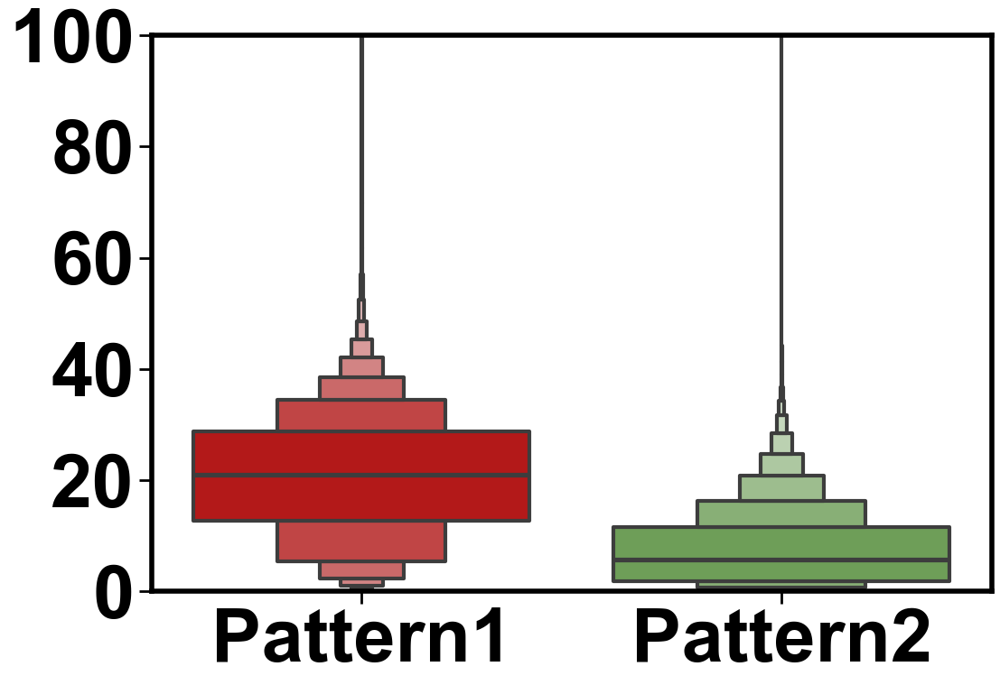

In [18]:
fig = plt.figure(figsize=(12, 8))
# colors = ['#69aa4c','#CC0000','#ebc874']
colors = ['#CC0000','#69aa4c',]
sns.boxenplot(x="Dbedrock_Frequency", y="Sbedrock_div_ET", data=df1, linewidth=3,
              hue='Dbedrock_Frequency',palette=colors,
              outlier_prop=0.0078125, showfliers=False, legend=False)
                
ax = plt.gca()

ax.tick_params(axis='x', which='major', length=10, width=2, direction='out')
ax.tick_params(axis='y', which='major', length=10, width=2, direction='out')

for spine in ax.spines.values():
    spine.set_edgecolor('black')  
    spine.set_linewidth(4)  

# for i, label in enumerate(ax.get_xticklabels()):
#     x_pos = label.get_position()[0]
#     ax.text(x_pos+0.28, 85, f'{n[i]}', ha='center', va='bottom', fontsize=size1, fontweight='bold', color='black')

plt.ylim(0, 100)


plt.xlabel('')  
plt.ylabel('')  

# plt.ylabel("$S_{{bedrock}}$ as a percentage of \nmean annual evapotranspiration (%)", fontsize=size1, fontweight='bold')  

current_ticks = [0,1]

# new_labels = ['Bedrcok water \nwithdrawn every year \nfrom 2003 to 2020', 
#                         'Bedrcok water \nwithdrawn some year(s) \nfrom 2003 to 2020', 
#                         'Bedrcok water \nnot needed to explain ET \nover course of study']
new_labels = ['Pattern1','Pattern2']

plt.xticks(ticks=current_ticks, labels=new_labels, fontsize=size1, fontweight='bold')

yticks =np.linspace(0,100,6).astype('int64')
plt.yticks(ticks=yticks,labels=yticks,fontsize=size1, fontweight='bold')

([<matplotlib.axis.YTick at 0x15061d7aafb0>,
 [Text(0, 0, '0'),
  Text(0, 20, '20'),
  Text(0, 40, '40'),
  Text(0, 60, '60'),
  Text(0, 80, '80'),
  Text(0, 100, '100')])

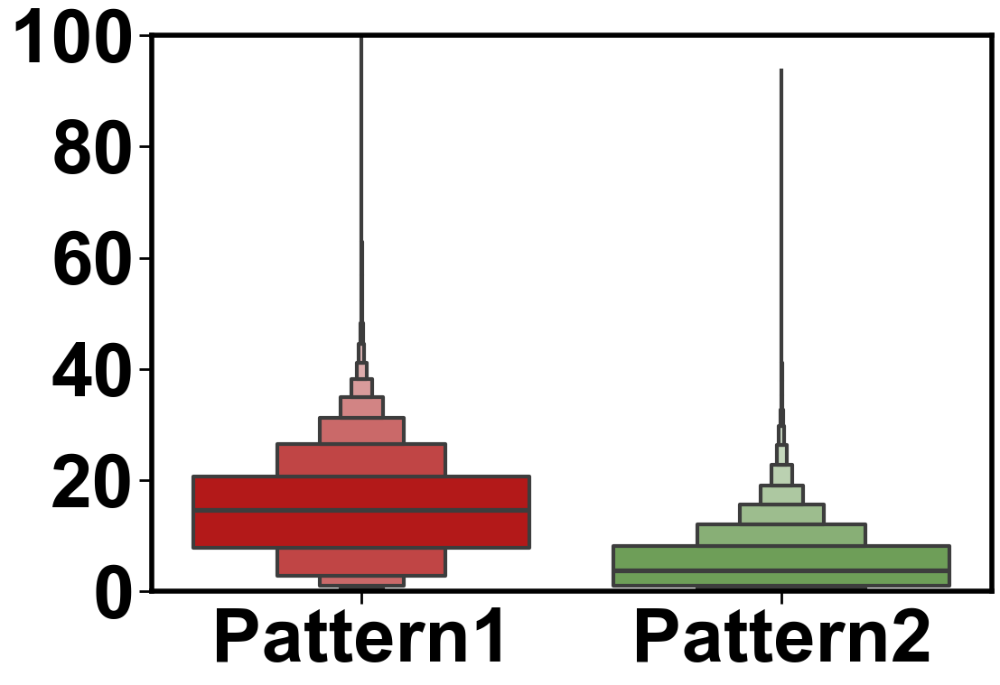

In [19]:
fig = plt.figure(figsize=(12, 8))
# colors = ['#69aa4c','#CC0000','#ebc874']
colors = ['#CC0000','#69aa4c',]
sns.boxenplot(x="Dbedrock_Frequency", y="Sbedrock_div_PR", data=df1, linewidth=3,
              hue='Dbedrock_Frequency',palette=colors,
              outlier_prop=0.0078125, showfliers=False, legend=False)
                
ax = plt.gca()

ax.tick_params(axis='x', which='major', length=10, width=2, direction='out')
ax.tick_params(axis='y', which='major', length=10, width=2, direction='out')

for spine in ax.spines.values():
    spine.set_edgecolor('black')  
    spine.set_linewidth(4)  

# for i, label in enumerate(ax.get_xticklabels()):
#     x_pos = label.get_position()[0]
#     ax.text(x_pos+0.28, 85, f'{n[i]}', ha='center', va='bottom', fontsize=size1, fontweight='bold', color='black')

plt.ylim(0, 100)


plt.xlabel('')  
plt.ylabel('')  
# plt.ylabel("$S_{{bedrock}}$ as a percentage of \nmean annual precipitation (%)", fontsize=size1, fontweight='bold')  

current_ticks = [0,1]

# new_labels = ['Bedrcok water \nwithdrawn every year \nfrom 2003 to 2020', 
#                         'Bedrcok water \nwithdrawn some year(s) \nfrom 2003 to 2020', 
#                         'Bedrcok water \nnot needed to explain ET \nover course of study']
new_labels = ['Pattern1','Pattern2']

plt.xticks(ticks=current_ticks, labels=new_labels, fontsize=size1, fontweight='bold')

yticks =np.linspace(0,100,6).astype('int64')
plt.yticks(ticks=yticks,labels=yticks,fontsize=size1, fontweight='bold')